# MOSTA Virtual Video

This notebook runs the full MOSTA baseline trajectory video workflow inside the current downstream repo:

- load MOSTA data and pretrained dynamics model
- sample the observed `t=0` pool
- run split-SDE simulation from `0.0 -> 3.0`
- classify simulated cells over time
- optionally compute focus communication overlays
- render frames and export a GIF

Note: execution requires the same dynamical-model environment used by the original MOSTA pipeline. If model dependencies are missing, the import/config cells still work but the run cell will fail until that environment is available.


In [1]:
from pathlib import Path
import json
import pandas as pd
from IPython.display import Image, display
import sys


def find_repo_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    for candidate in [start, *start.parents]:
        if (candidate / "assets").exists() and (candidate / "notebooks").exists():
            return candidate
    raise FileNotFoundError("Could not locate cytobridge-downstream repository root.")


DOWNSTREAM_ROOT = find_repo_root()
if str(DOWNSTREAM_ROOT) not in sys.path:
    sys.path.insert(0, str(DOWNSTREAM_ROOT))

from downstream_helpers import (
    MostaBaselineVideoConfig,
    list_output_files,
    resolve_mosta_baseline_video_output_dir,
    run_mosta_baseline_video,
)


In [2]:
config = MostaBaselineVideoConfig(
    output_name="mosta_brain_comm_baseline_notebook",
    time_start=0.0,
    time_end=3.0,
    time_step=0.05,
    sde_n_samples=50000,
    split_sde_dt=0.05,
    split_sigma=0.03,
    split_growth_alpha=1.0,
    spatial_warp_to_observed=True,
    spatial_warp_k=8,
    spatial_warp_eps=1e-6,
    interaction_m=1024,
    classifier_epochs=500,
    classifier_hidden=128,
    classifier_n_pcs=12,
    classifier_feature_start=1,
    classifier_best_metric="bacc",
    classifier_train_on_full_data=True,
    classifier_cache=True,
    classifier_cache_path="assets/mosta/classifier_cache/classifier_resmlp_52fb7dc647bfe334.pt",
    classifier_force_load=True,
    video_style="fixed_2d",
    video_point_subsample=50000,
    gif_fps=4,
    frame_dpi=300,
    point_size=2.5,
    point_alpha=0.9,
    show_titles=False,
    draw_focus_interactions=True,
    focus_celltype="Brain",
    focus_mode="both",
    focus_top_k=3,
    focus_min_weight=0.0,
    focus_edge_width_min=1.0,
    focus_edge_width_max=2.6,
    focus_edge_alpha_min=0.25,
    focus_edge_alpha_max=0.85,
    focus_edge_curve=0.18,
    focus_edge_curve_bi=0.35,
    focus_neighbor_pct=0.2,
    focus_other_desaturate=0.0,
    focus_show_endpoints=True,
    focus_endpoint_size=26.0,
    focus_endpoint_alpha=0.95,
    focus_endpoint_edgecolor="#ffffff",
    focus_endpoint_linewidth=0.8,
    attention_stride=1,
    attention_max_cells=30000,
    attention_use_real_observed=False,
    axis_limit_mode="per_timepoint",
    axis_pad_frac=0.03,
    panel_size=4.2,
    camera_elev=28.0,
    camera_azim=-54.0,
    random_seed=42,
    clean_output=True,
)

output_dir = resolve_mosta_baseline_video_output_dir(config)
output_dir


PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook')

In [3]:
result = run_mosta_baseline_video(config)
result


Loading custom config from: /Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/assets/mosta/mosta_config.yaml
[spatial-warp piecewise] segment 0.0->1.0 | targets=[0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
[piecewise split-SDE] start | n_init=50000, ts_points=21, dt=0.05, sigma=0.03, growth_alpha=1.0, t_range=(0.0,1.0), est_steps=20
[piecewise split-SDE] done | timepoints=21, shape0=(51234, 52)
[spatial-warp piecewise] segment 1.0->2.0 | targets=[1.0, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5, 1.55, 1.6, 1.65, 1.7, 1.75, 1.8, 1.85, 1.9, 1.95, 2.0]
[piecewise split-SDE] start | n_init=76715, ts_points=21, dt=0.05, sigma=0.03, growth_alpha=1.0, t_range=(1.0,2.0), est_steps=20
[piecewise split-SDE] done | timepoints=21, shape0=(77985, 52)
[spatial-warp piecewise] segment 2.0->3.0 | targets=[2.0, 2.05, 2.1, 2.15, 2.2, 2.25, 2.3, 2.35, 2.4, 2.45, 2.5, 2.55, 2.6, 2.65, 2.7, 2.75, 2.8, 2.85, 2.9, 2.95, 

MostaBaselineVideoResult(output_dir=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook'), frames_dir=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/frames'), gif_path=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/baseline_0_to_3_step0p05.gif'), summary_path=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/summary.json'), baseline_counts_csv=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/baseline_counts_by_time.csv'), label_color_json=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/label_to_color.json'), all_time_communications_pkl=PosixPath('/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mo

In [4]:
list_output_files(result.output_dir)


['all_time_communications.pkl',
 'attention/attn_mean_interp_t0.0.npy',
 'attention/attn_mean_interp_t0.05.npy',
 'attention/attn_mean_interp_t0.1.npy',
 'attention/attn_mean_interp_t0.15.npy',
 'attention/attn_mean_interp_t0.2.npy',
 'attention/attn_mean_interp_t0.25.npy',
 'attention/attn_mean_interp_t0.3.npy',
 'attention/attn_mean_interp_t0.35.npy',
 'attention/attn_mean_interp_t0.4.npy',
 'attention/attn_mean_interp_t0.45.npy',
 'attention/attn_mean_interp_t0.5.npy',
 'attention/attn_mean_interp_t0.55.npy',
 'attention/attn_mean_interp_t0.6.npy',
 'attention/attn_mean_interp_t0.65.npy',
 'attention/attn_mean_interp_t0.7.npy',
 'attention/attn_mean_interp_t0.75.npy',
 'attention/attn_mean_interp_t0.8.npy',
 'attention/attn_mean_interp_t0.85.npy',
 'attention/attn_mean_interp_t0.9.npy',
 'attention/attn_mean_interp_t0.95.npy',
 'attention/attn_mean_interp_t1.0.npy',
 'attention/attn_mean_interp_t1.05.npy',
 'attention/attn_mean_interp_t1.1.npy',
 'attention/attn_mean_interp_t1.15.np

In [5]:
summary = json.loads(result.summary_path.read_text(encoding="utf-8"))
summary


{'status': 'ok',
 'timestamp': '2026-03-20 20:41:42',
 'render_mode': 'baseline_only',
 'data_csv': '/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/data/mosta/mosta_four_time_with_celltype_refined.csv',
 'annotation_key': 'Annotation',
 'time_start': 0.0,
 'time_end': 3.0,
 'time_step': 0.05,
 'timepoints': [0.0,
  0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9,
  0.95,
  1.0,
  1.05,
  1.1,
  1.15,
  1.2,
  1.25,
  1.3,
  1.35,
  1.4,
  1.45,
  1.5,
  1.55,
  1.6,
  1.65,
  1.7,
  1.75,
  1.8,
  1.85,
  1.9,
  1.95,
  2.0,
  2.05,
  2.1,
  2.15,
  2.2,
  2.25,
  2.3,
  2.35,
  2.4,
  2.45,
  2.5,
  2.55,
  2.6,
  2.65,
  2.7,
  2.75,
  2.8,
  2.85,
  2.9,
  2.95,
  3.0],
 'n_frames': 61,
 'gif_path': '/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/baseline_0_to_3_step0p05.gif',
 'frames_dir': '/Users/zhenyizhang/Documents/GitHub/cytobrid

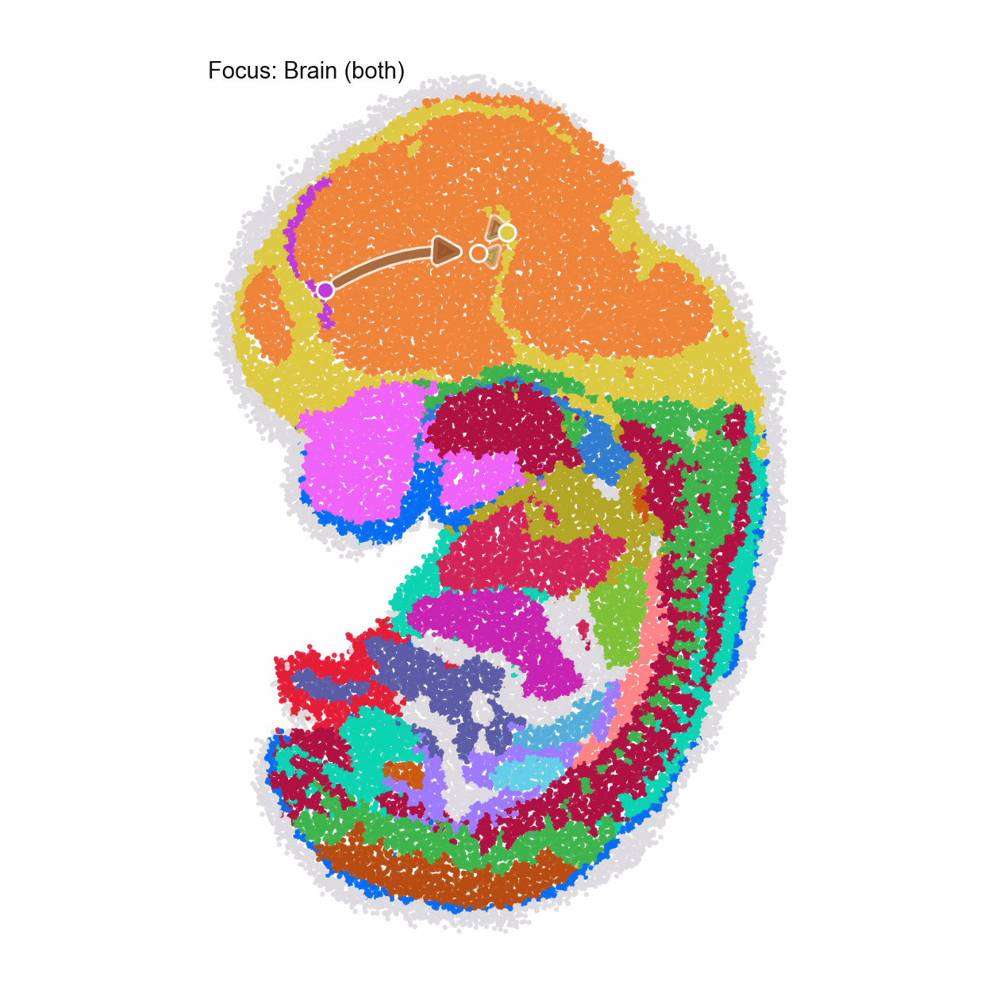

/Users/zhenyizhang/Documents/GitHub/cytobridge-downstream/results/mosta_brain_comm_baseline_notebook/baseline_0_to_3_step0p05.gif


In [6]:
display(Image(filename=str(result.gif_path)))
print(result.gif_path)


In [7]:
pd.read_csv(result.baseline_counts_csv).head()


,time,n_baseline
0,0.00,51234
1,0.05,52500
2,0.10,53733
3,0.15,55018
4,0.20,56255


In [8]:
if result.communication_sampling_csv is not None:
    pd.read_csv(result.communication_sampling_csv).head()
else:
    print("Focus communication overlay disabled.")


## Notes

- This notebook runs a complete `run -> frame -> GIF -> summary` flow rather than reconstructing from an existing run directory.
- The API entry point is `run_mosta_baseline_video(config)` from `downstream_helpers/mosta_baseline_video.py`.
- A thin CLI wrapper is also available at `scripts/mosta_baseline_video_local.py`.
